INPUT DATASET & LIBRARY

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
import folium
import plotly.express as px

In [ ]:
data = pd.read_csv('HASIL_GABUNGAN_KESEJAHTERAAN - DATA_INDIKATOR.csv')

In [ ]:
# Baca data indikator
df = pd.read_csv('HASIL_GABUNGAN_KESEJAHTERAAN - DATA_INDIKATOR.csv')

# Tampilkan 5 baris awal
df.head()

,Provinsi,Tahun,PDRB,IPM,Kemiskinan,Gini
0,ACEH,2010,22450.14,67.09,20.980,0.3000
1,ACEH,2011,22704.80,67.45,19.570,0.3300
2,ACEH,2012,23099.13,67.81,19.020,0.3305
3,ACEH,2013,23228.59,68.30,17.660,0.3360
4,ACEH,2014,23129.04,68.81,17.515,0.3310


SLIDE 1: PDRB VS KEMISKINAN

In [ ]:
# 4. Filter hanya untuk tahun 2024
df2024 = df[df['Tahun'] == 2024].copy()

In [ ]:
x = df2024['PDRB']        # pastikan nama kolom sesuai
y = df2024['Kemiskinan']           # pastikan nama kolom sesuai
gini = df2024['Gini']          # pastikan nama kolom sesuai

In [ ]:
# 6. Skala ukuran bubble (sesuaikan faktor skala agar bubble tidak terlalu besar/kecil)
size_factor = 2500
sizes = gini * size_factor

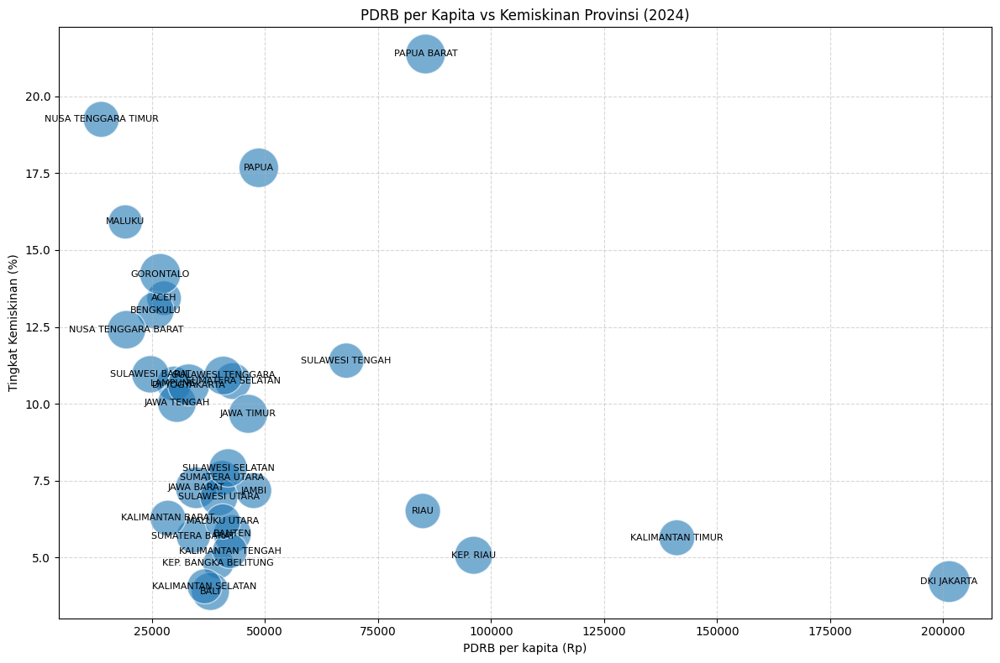

In [ ]:
# 6. Skala ukuran bubble (sesuaikan faktor skala agar bubble tidak terlalu besar/kecil)
# Mengurangi size_factor untuk menghindari ukuran gambar yang terlalu besar
size_factor = 3000 # Mengurangi faktor skala
# Jika perlu, pertimbangkan scaling data gini sebelum mengalikan (contoh: gini**2)
sizes = gini * size_factor

# 7. Buat bubble chart
plt.figure(figsize=(12, 8))
plt.scatter(x, y, s=sizes, alpha=0.6, edgecolors='w')

# 8. Tambahkan label provinsi di tengah bubble
for _, row in df2024.iterrows():
    plt.text(
        row['PDRB'],
        row['Kemiskinan'],
        row['Provinsi'],
        ha='center',
        va='center',
        fontsize=8,
        color='black'
    )

# 9. Styling
plt.xlabel('PDRB per kapita (Rp)')
plt.ylabel('Tingkat Kemiskinan (%)')
plt.title('PDRB per Kapita vs Kemiskinan Provinsi (2024)')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()

# 10. Tampilkan plot
plt.show()

# Tambah label provinsi (opsional, tapi hati-hati jika titiknya terlalu rapat)
# Perhatikan: Kode di bawah ini menggunakan df_2022, yang mungkin tidak ada atau tidak diinginkan
# Jika Anda ingin menambahkan label untuk tahun 2024, gunakan df2024
# Hapus atau modifikasi baris ini sesuai kebutuhan Anda.
# for i in range(df_2022.shape[0]):
#     plt.text(
#         df_2022['PDRB'].iloc[i],
#         df_2022['Kemiskinan'].iloc[i],
#         df_2022['Provinsi'].iloc[i],
#         fontsize=8
#     )

SLIDE 2: IPM VS PDRB

Visualisasai trend

In [ ]:
#Filter untuk Tahun 2010–2024
df_trend = df[(df['Tahun'] >= 2010) & (df['Tahun'] <= 2024)].copy()

In [ ]:
# 5. Inisialisasi figure
plt.figure(figsize=(14, 8))

<Figure size 1400x800 with 0 Axes>

<Figure size 1400x800 with 0 Axes>

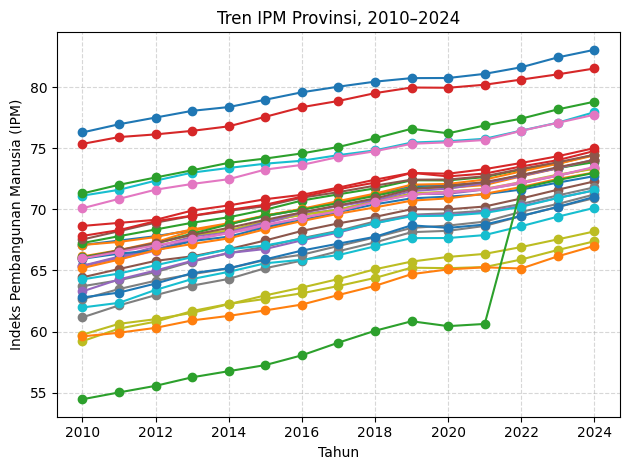

In [ ]:
# 6. Plot satu garis per provinsi
for prov in df_trend['Provinsi'].unique():
    prov_data = df_trend[df_trend['Provinsi'] == prov].sort_values('Tahun')
    plt.plot(
        prov_data['Tahun'],
        prov_data['IPM'],
        marker='o',
        label=prov
    )

# 7. Styling
plt.xlabel('Tahun')
plt.ylabel('Indeks Pembangunan Manusia (IPM)')
plt.title('Tren IPM Provinsi, 2010–2024')
plt.grid(linestyle='--', alpha=0.5)

# 8. Legenda dengan warna berbeda otomatis
# plt.legend(title='Provinsi', bbox_to_anchor=(1.05, 1), loc='upper left',
#            fontsize='small', title_fontsize='medium')

plt.tight_layout()
plt.show()

Visualisasi line plot time

In [ ]:
# 5. Siapkan daftar provinsi dan colormap
provs = sorted(df_trend['Provinsi'].unique())
n = len(provs)
cmap = plt.cm.get_cmap('tab20', n)  # colormap dengan n warna

<ipython-input-348-447570269>:4: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



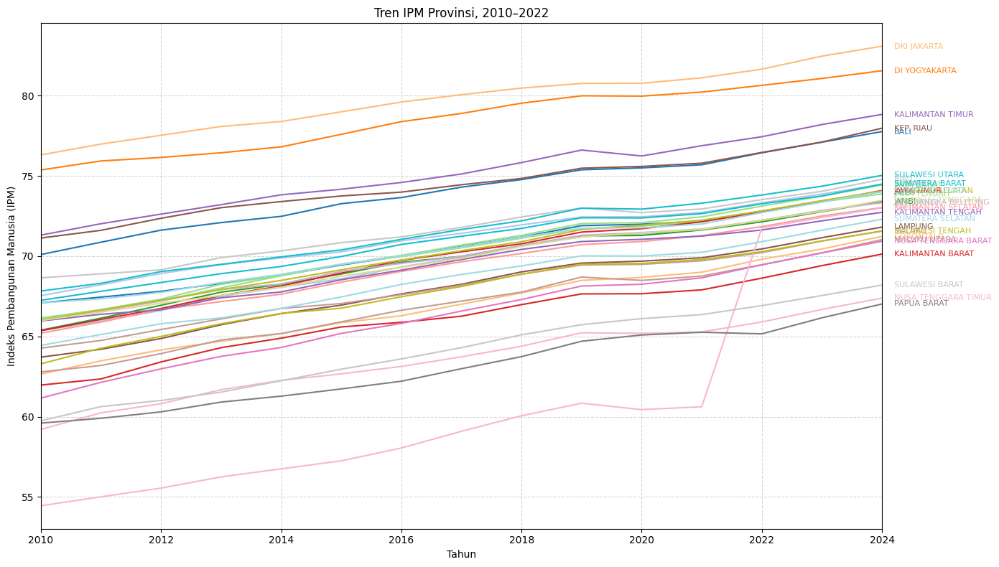

In [ ]:
# 6. Plot setiap provinsi
plt.figure(figsize=(14, 8))
for idx, prov in enumerate(provs):
    data = df_trend[df_trend['Provinsi'] == prov].sort_values('Tahun')
    x = data['Tahun']
    y = data['IPM']
    plt.plot(x, y, label=prov, color=cmap(idx), lw=1.5)
    # label di ujung garis
    x_last = x.iloc[-1]
    y_last = y.iloc[-1]
    # offset vertikal berdasarkan posisi index agar tersebar
    dy = (idx - n/2) * 0.002
    plt.text(
        x_last + 0.2,
        y_last + dy,
        prov,
        color=cmap(idx),
        fontsize=8,
        va='center'
    )

# 7. Styling
plt.xlabel('Tahun')
plt.ylabel('Indeks Pembangunan Manusia (IPM)')
plt.title('Tren IPM Provinsi, 2010–2022')
plt.xlim(2010, 2024)
plt.grid(linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

Visualisasi scatter plot

In [ ]:
# 5. Siapkan variabel
x = df_trend['PDRB']
y = df_trend['IPM']
c = df_trend['Tahun']          # untuk pewarnaan
labels = df_trend['Provinsi']

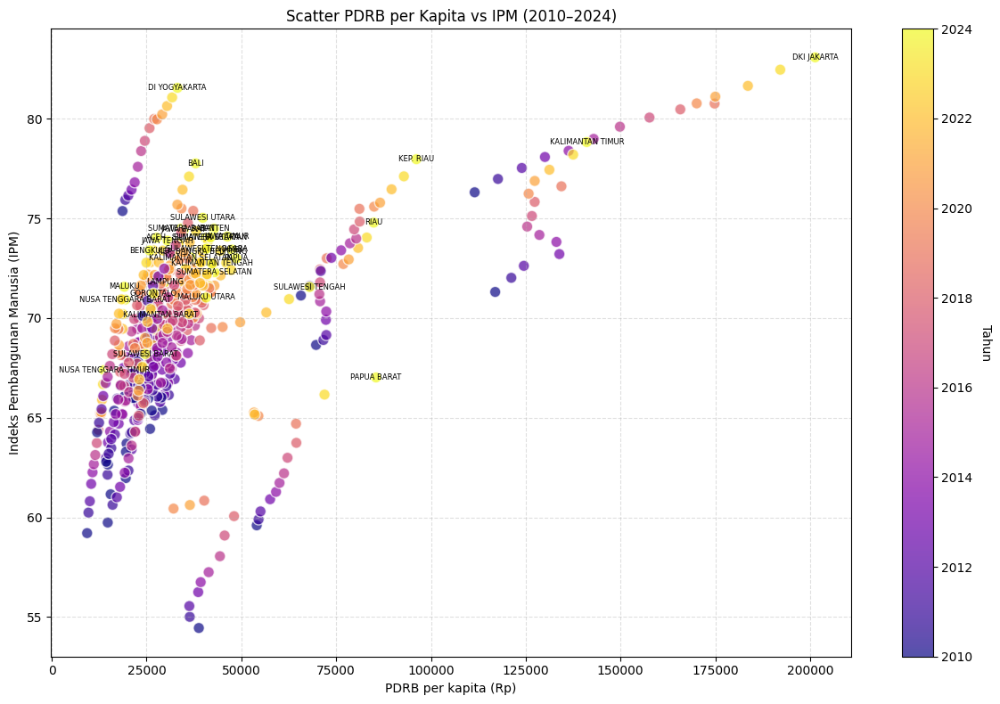

In [ ]:
# Plot scatter dengan colormap plasma
plt.figure(figsize=(12, 8))
sc = plt.scatter(x, y, c=c, cmap='plasma', s=80, alpha=0.7, edgecolors='w')
cbar = plt.colorbar(sc)
cbar.set_label('Tahun', rotation=270, labelpad=15)

# Annotasi nama provinsi pada tiap titik (fontsize kecil)
# Filter data to only include the latest year for annotation
df_trend_latest_year = df_trend[df_trend['Tahun'] == df_trend['Tahun'].max()].copy()

# Get the current plot limits
x_min, x_max = plt.xlim()
y_min, y_max = plt.ylim()

for idx, row in df_trend_latest_year.iterrows():
    # Check if the coordinates are within reasonable limits before annotating
    if (x_min <= row['PDRB'] <= x_max) and (y_min <= row['IPM'] <= y_max):
         plt.text(
            row['PDRB'],
            row['IPM'],
            row['Provinsi'],
            fontsize=6,
            ha='center',
            va='center'
        )
    else:
        # Optional: print a warning for points outside current limits
        print(f"Warning: Annotation for {row['Provinsi']} at ({row['PDRB']}, {row['IPM']}) skipped as it's outside plot limits.")


# Styling
plt.xlabel('PDRB per kapita (Rp)')
plt.ylabel('Indeks Pembangunan Manusia (IPM)')
plt.title('Scatter PDRB per Kapita vs IPM (2010–2024)')
plt.grid(True, linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

# The subsequent styling block is redundant as it follows the show() call.
# Remove the duplicate styling block below:
# plt.xlabel('PDRB per kapita (Rp)')
# plt.ylabel('Indeks Pembangunan Manusia (IPM)')
# plt.title('Scatter PDRB per Kapita vs IPM (2010–2024)')
# plt.grid(True, linestyle='--', alpha=0.4)
# plt.tight_layout()
# plt.show()

Visualisasi IPM vs PDRB

In [ ]:
# Filter hanya untuk tahun 2024
df2024 = df[df['Tahun'] == 2024].copy()

In [ ]:
# Siapkan variabel untuk plot
x = df2024['IPM']             # sumbu X
y = df2024['PDRB']            # sumbu Y
provs = df2024['Provinsi']    # label

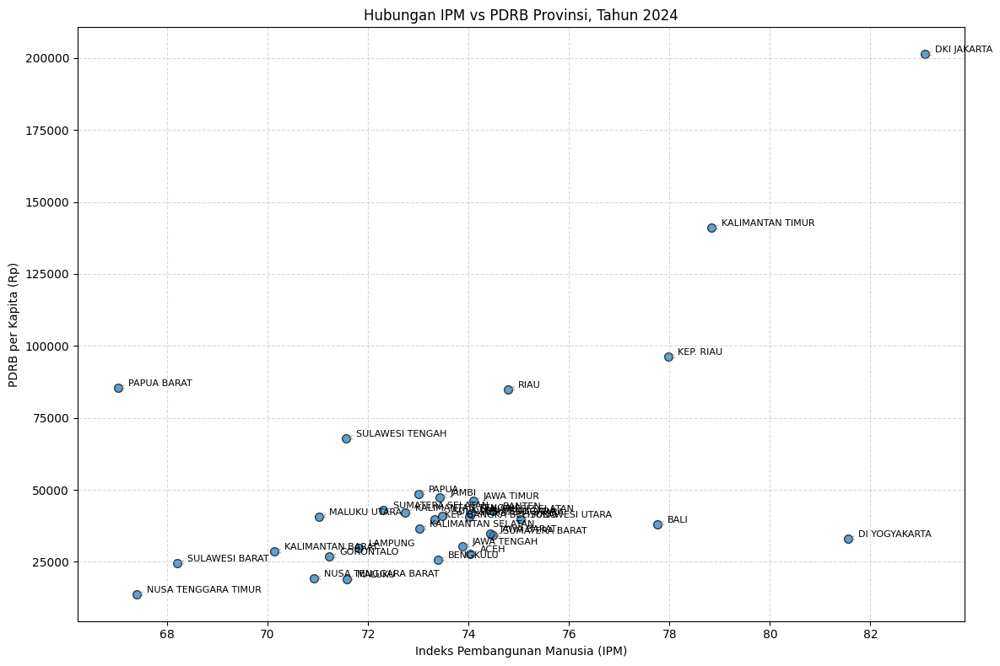

In [ ]:
# Buat scatter plot
plt.figure(figsize=(12, 8))
plt.scatter(x, y, s=50, alpha=0.7, edgecolors='k')

# 7. Tambahkan pointer (arrow) ke tiap nama provinsi
for _, row in df2024.iterrows():
    xi, yi, label = row['IPM'], row['PDRB'], row['Provinsi']
    # Atur offset teks agar tidak menumpuk titik
    dx, dy = 0.2, 0.2
    plt.annotate(
        label,
        xy=(xi, yi),
        xytext=(xi + dx, yi + dy),
        textcoords='data',
        fontsize=8,
        arrowprops=dict(arrowstyle='->', lw=0.5, color='gray'),
        ha='left',
        va='bottom'
    )

# 8. Styling
plt.xlabel('Indeks Pembangunan Manusia (IPM)')
plt.ylabel('PDRB per Kapita (Rp)')
plt.title('Hubungan IPM vs PDRB Provinsi, Tahun 2024')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()

# 9. Tampilkan plot
plt.show()

SLIDE 3: IPM VS KEMISKINAN

In [ ]:
# Filter data indikator hanya untuk tahun 2024
df2024 = df[df['Tahun'] == 2024].copy()

In [ ]:
# Siapkan variabel
x = df2024['IPM']                 # sumbu X
y = df2024['Kemiskinan']        # sumbu Y
sizes = df2024['Gini'] * 2000   # skala ukuran bubble (atur faktor sesuai kebutuhan)
labels = df2024['Provinsi']

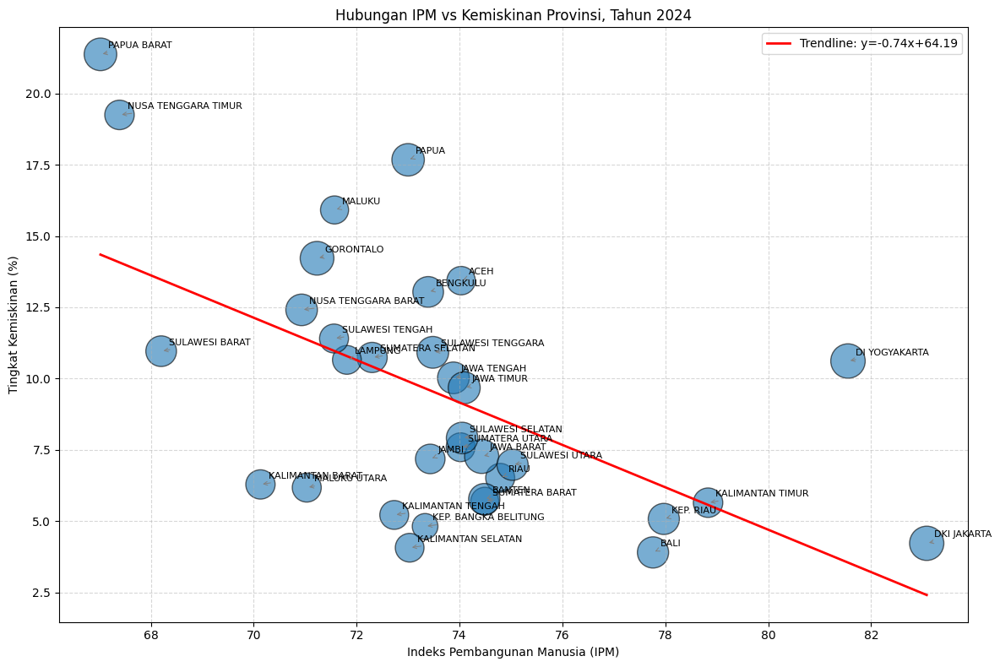

In [ ]:
# 6. Buat scatter plot
plt.figure(figsize=(12, 8))
plt.scatter(x, y, s=sizes, alpha=0.6, edgecolors='k')

# 7. Tambahkan pointer (arrow) ke tiap titik
for _, row in df2024.iterrows():
    xi, yi, lbl = row['IPM'], row['Kemiskinan'], row['Provinsi']
    dx, dy = 0.15, 0.15  # sesuaikan offset jika label saling tumpang
    plt.annotate(
        lbl,
        xy=(xi, yi),
        xytext=(xi + dx, yi + dy),
        textcoords='data',
        fontsize=8,
        arrowprops=dict(arrowstyle='->', lw=0.7, color='gray'),
        ha='left',
        va='bottom'
    )

# 8. Hitung dan plot garis regresi linear
#    gunakan numpy.polyfit
m, b = np.polyfit(x, y, 1)
x_vals = np.linspace(x.min(), x.max(), 100)
y_vals = m * x_vals + b
plt.plot(x_vals, y_vals, color='red', linewidth=2, label=f'Trendline: y={m:.2f}x+{b:.2f}')

# 9. Styling
plt.xlabel('Indeks Pembangunan Manusia (IPM)')
plt.ylabel('Tingkat Kemiskinan (%)')
plt.title('Hubungan IPM vs Kemiskinan Provinsi, Tahun 2024')
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend(loc='upper right')
plt.tight_layout()

# 10. Tampilkan plot
plt.show()

PETA HEATMAP GABUNGAN

In [ ]:
data = pd.read_csv('HASIL_GABUNGAN_KESEJAHTERAAN - METADATA_PROVINSI.csv')

In [ ]:
df2024 = df[df['Tahun']==2024].copy()

In [ ]:
# 5. Normalisasi Min–Max
#   - IPM & PDRB: semakin tinggi semakin baik
df2024['ipm_norm'] = (df2024['IPM'] - df2024['IPM'].min()) / (df2024['IPM'].max() - df2024['IPM'].min())
df2024['pdrb_norm'] = (df2024['PDRB'] - df2024['PDRB'].min()) / (df2024['PDRB'].max() - df2024['PDRB'].min())

In [ ]:
#   - Kemiskinan: semakin rendah semakin baik → dibalik
kem_norm = (df2024['Kemiskinan'] - df2024['Kemiskinan'].min()) / (df2024['Kemiskinan'].max() - df2024['Kemiskinan'].min())
df2024['kemiskinan_norm_inv'] = 1 - kem_norm

In [ ]:
# 6. Hitung skor gabungan (rata-rata sederhana)
df2024['skor_kesejahteraan'] = (
    df2024['ipm_norm'] +
    df2024['pdrb_norm'] +
    df2024['kemiskinan_norm_inv']
) / 3

In [ ]:
# 7. Merge dengan metadata provinsi (kode BPS)
#    Pastikan kolom untuk merge sesuai (misal: 'Provinsi' & 'kode_bps')
df_map = df2024.merge(
    meta[['Provinsi','Kode BPS']],
    on='Provinsi',
    how='left'
)

In [ ]:
# --- Added code ---
# Debug: Check columns in df_map after merging with meta
print("Columns in df_map after merging with meta:")
print(df_map.columns)
# --- End added code ---

# 8. Load GeoJSON Indonesia (provinsi) — gunakan versi lengkap
# ambil GeoJSON lengkap provinsi
geojson_url = 'https://raw.githubusercontent.com/superpikar/indonesia-geojson/master/indonesia-province.json'
gdf = gpd.read_file(geojson_url)

# 1. Drop baris df_map tanpa Kode BPS
df_map_clean = df_map.dropna(subset=['Kode BPS']).copy()

# 2. Cast ke integer
df_map_clean['Kode BPS'] = df_map_clean['Kode BPS'].astype(int)

# 3. Rename kolom di geodataframe
gdf = gdf.rename(columns={'kode': 'Kode BPS'})

# 4. Cast juga gdf['Kode BPS'] ke integer
gdf['Kode BPS'] = gdf['Kode BPS'].astype(int)

# 5. Sekarang merge dengan skor
gdf = gdf.merge(
    df_map_clean[['Kode BPS','skor_kesejahteraan']],
    on='Kode BPS',
    how='left'
)

# 6. Cek hasil merge
print(gdf[['Kode BPS','skor_kesejahteraan']].head())

Columns in df_map after merging with meta:
Index(['Provinsi', 'Tahun', 'PDRB', 'IPM', 'Kemiskinan', 'Gini', 'ipm_norm',
       'pdrb_norm', 'kemiskinan_norm_inv', 'skor_kesejahteraan', 'Kode BPS'],
      dtype='object')
   Kode BPS  skor_kesejahteraan
0        85                 NaN
1        52                 NaN
2        75                 NaN
3        74                 NaN
4        34                 NaN


In [ ]:
fig = px.choropleth(
    df_map,
    geojson=gdf,
    locations='Kode BPS',  # Changed from 'kode_bps' to 'Kode BPS'
    color='skor_kesejahteraan',
    featureidkey='properties.kode_bps',
    color_continuous_scale='RdYlGn',
    range_color=(0,1),
    labels={'skor_kesejahteraan':'Skor Kesejahteraan'}
)
fig.update_geos(fitbounds="locations", visible=False)
fig.show()